# Bibliotecas

## Instalações

In [ ]:
!pip install pyproj

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Bibliotecas

In [ ]:
# Vendo os dados
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import plotly.express as px

In [ ]:
# Processamento dos dados
from sklearn.impute import KNNImputer
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedShuffleSplit

In [ ]:
# Treinamento da máquina
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV, KFold
from sklearn.metrics.cluster import adjusted_mutual_info_score

In [ ]:
# Todos os dados
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, KNNImputer, SimpleImputer

In [ ]:
# Plotagem 3D
from shapely.geometry import Point
from pyproj import Proj, CRS
import plotly.express as px
import geopandas as gpd
from plotly.subplots import make_subplots

# Dado inicial (data)

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Dados Programação/Dados de Poço/hidden_test.csv', sep = ';')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122397 entries, 0 to 122396
Data columns (total 29 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   WELL                               122397 non-null  object 
 1   DEPTH_MD                           122397 non-null  float64
 2   X_LOC                              122386 non-null  float64
 3   Y_LOC                              122386 non-null  float64
 4   Z_LOC                              122386 non-null  float64
 5   GROUP                              122397 non-null  object 
 6   FORMATION                          114248 non-null  object 
 7   CALI                               118954 non-null  float64
 8   RSHA                               25683 non-null   float64
 9   RMED                               112580 non-null  float64
 10  RDEP                               122386 non-null  float64
 11  RHOB                               1128

# Processamento dos dados

## Função para remover dados dos atributos (dados)

In [ ]:
def remocao_dados(dataframe, porcentagem):
  df = dataframe.copy()
  colunas = df.columns
  lc = np.arange(0, len(colunas))
  for i in lc:
    if df.__getitem__(colunas[i]).count() < len(df)*porcentagem:
      df.drop(colunas[i], axis = 1, inplace = True)
    else:
      pass
  return df

In [ ]:
dados = remocao_dados(data, 0.5)

## Categorizando (dados)

In [ ]:
codi_lab = preprocessing.LabelEncoder()

In [ ]:
cat = dados[['GROUP', 'FORMATION', 'WELL']]
categoria_group = codi_lab.fit_transform(cat['GROUP'])
categoria_form = codi_lab.fit_transform(cat['FORMATION'])
categoria_well = codi_lab.fit_transform(cat['WELL'])
treino_lab = pd.DataFrame(zip(categoria_group, categoria_form, categoria_well), columns = cat.columns)
dados[['GROUP', "FORMATION", 'WELL']] = treino_lab

## Separar dados para cada poço

### Maneira rápida (dados_pocos)

In [ ]:
def contagem_pocos (dataframe):
  tam_cada_poco = dataframe['WELL'].value_counts(sort = False)
  li = np.arange(0, len(dataframe.WELL.unique()))
  x = [0]
  y = [tam_cada_poco[0]]
  for i in li:
    if i == 0:
      pass
    elif i >= 0:
      xi = y[i-1]
      yi = y[i-1]+tam_cada_poco[i]
      x.append(xi)
      y.append(yi)
  t = pd.DataFrame(zip(x, y))
  return t

In [ ]:
def separa_pocos(contagem_pocos, dataframe):
  list_poco = []
  pocos = dataframe['WELL'].unique()
  li = np.arange(0, len(dataframe.WELL.unique()))   
  for i in li:
    list_poco.append({pocos[i]: dataframe[contagem_pocos[0][i]:contagem_pocos[1][i]]})
  return list_poco

In [ ]:
contagem = contagem_pocos(dados)
dados_pocos = separa_pocos(contagem, dados)

### Maneira lenta (todos_pocos)

In [ ]:
def separa_dados_poco(dados):
  colunas = dados.columns.drop('WELL')
  sel_poco = []
  for i in colunas:
    p = pd.DataFrame(dados.groupby(by=['WELL'])[i].apply(np.array)).reset_index()
    dados_poco = p
    sel_poco.append(p)

  quantos_poco = np.arange(0, len(sel_poco[0]))
  tamanho_cada_poco = []

  for i in quantos_poco:
    q = len(pd.DataFrame(sel_poco[0].transpose()[i]).transpose()['DEPTH_MD'][i])
    tamanho_cada_poco.append(q)

  x = [0]
  y = [tamanho_cada_poco[0]]

  for i in quantos_poco:
    if i == 0:
      pass
    elif i >= 0:
      xi = y[i-1]
      yi = y[i-1]+tamanho_cada_poco[i]
      x.append(xi)
      y.append(yi)

  df_uni = dados['WELL'].unique()
  df = []
  for i in quantos_poco:
    df.append({df_uni[i]: dados[x[i]:y[i]]})
  return df

In [ ]:
todos_pocos = separa_dados_poco(dados)

## Separando dados em meta, atributos e rotulos

### Funções

In [ ]:
def def_meta(dataframe):
  m = dataframe[['WELL', 'X_LOC', 'Y_LOC', 'Z_LOC']].copy()

  return m



def def_atributos(dataframe):
  a = dataframe.drop(['WELL', 'X_LOC', 'Y_LOC',
                      'Z_LOC', 'BS', 'CALI',
                      'FORCE_2020_LITHOFACIES_LITHOLOGY',
                      'FORCE_2020_LITHOFACIES_CONFIDENCE'],
                      axis = 1).copy()
  
  return a

def def_rotulos(dataframe):
  r = dataframe[['FORCE_2020_LITHOFACIES_LITHOLOGY',
                 'FORCE_2020_LITHOFACIES_CONFIDENCE']].copy()

  return r

### Atribuição para todos os dados

In [ ]:
meta_dados = def_meta(dados)
atributos_dados = def_atributos(dados)
rotulos_dados = def_rotulos(dados)

## Impondo dados

### Chamando os impositores

In [ ]:
imp_int = IterativeImputer(initial_strategy = 'mean',
                           skip_complete = True,
                           max_iter = 15,
                           imputation_order = 'descending',
                           missing_values = np.nan)
imp_knn = KNNImputer(n_neighbors = 5,
                     weights = 'distance')

imp_mean = SimpleImputer(missing_values=np.nan, strategy='constant')

### Realizando a imposição

#### Para os dados de atributos poco-por-poco

In [ ]:
li = np.arange(0, len(dados_pocos))
atributos_pocos = []
for i in li:
  atributos_pocos.append(def_atributos(dados_pocos[i][i]))

In [ ]:
imp_atributos_nan = []
for i in li:
  a = pd.DataFrame(imp_mean.fit_transform(atributos_pocos[i]), columns = atributos_pocos[i].columns)
  imp_atributos_nan.append(a)

#### Para os metadados

In [ ]:
meta_knn = pd.DataFrame(imp_knn.fit_transform(meta_dados), columns = meta_dados.columns)

#### Para os dados de Rótulos

In [ ]:
rotulos_knn = pd.DataFrame(imp_knn.fit_transform(rotulos_dados), columns = rotulos_dados.columns)

#### Para Atributos dados

In [ ]:
atributos_imp = pd.DataFrame(imp_int.fit_transform(atributos_dados), columns = atributos_dados.columns)

/usr/local/lib/python3.7/dist-packages/sklearn/impute/_iterative.py:701: ConvergenceWarning:

[IterativeImputer] Early stopping criterion not reached.



## Agregando os dados impostos

In [ ]:
dados_agregados = meta_knn.join([atributos_imp, rotulos_knn])

# Dados processados

In [ ]:
atributos = dados_agregados.drop(['WELL',	'X_LOC', 	'Y_LOC', 'Z_LOC',
                                  'FORCE_2020_LITHOFACIES_LITHOLOGY',
                                  'FORCE_2020_LITHOFACIES_CONFIDENCE'], axis = 1)
rotulos = dados_agregados['FORCE_2020_LITHOFACIES_LITHOLOGY']

## Normalizando dados

In [ ]:
norm_std = StandardScaler()

In [ ]:
norm_dados = pd.DataFrame(norm_std.fit_transform(atributos), columns = atributos.columns)

# Separando dados de Treino e Teste

In [ ]:
sep_sss = StratifiedShuffleSplit(n_splits=5, test_size=0.5, random_state = 10)

for treino_indice, teste_indice in sep_sss.split(atributos, rotulos):
  X_treino, X_teste = atributos.iloc[treino_indice], atributos.iloc[teste_indice]
  y_treino, y_teste = rotulos.iloc[treino_indice], rotulos.iloc[teste_indice]

In [ ]:
print('A diferença entre os dados de Treino e de Teste para cada categoria litológica é de')
print((y_treino.value_counts()*100/len(y_treino) - y_teste.value_counts()*100/len(y_teste)))

A diferença entre os dados de Treino e de Teste para cada categoria litológica é de
65000.0   -0.000675
30000.0   -0.001447
65030.0   -0.001470
70000.0    0.000112
88000.0    0.000087
80000.0    0.000059
70032.0   -0.001595
99000.0    0.001647
86000.0    0.001642
74000.0    0.001638
90000.0    0.000003
Name: FORCE_2020_LITHOFACIES_LITHOLOGY, dtype: float64


# Treinando modelo

In [ ]:
hiper_parametros = {
    "n_estimators" : randint(128, 513),
    "max_depth" : randint(3, 10),
    "min_samples_split": randint(2, 33),
    "min_samples_leaf": randint(2, 33),
    "bootstrap" : [True, False],
    "criterion": ["gini", "entropy"]
    }

In [ ]:
random_search = RandomizedSearchCV(RandomForestClassifier(),
                    hiper_parametros,
                    n_iter = 5,
                    cv = KFold(n_splits = 5,
                               shuffle=True),
                    scoring='adjusted_mutual_info_score')

In [ ]:
print(X_treino.shape, y_treino.shape)

(61198, 14) (61198,)


In [ ]:
#treinos_ranfor = random_search.fit(X_treino, y_treino)

In [ ]:
#melhor_estimador = treinos_ranfor.best_estimator_
#melhor_estimador

In [ ]:
#RandomForestClassifier(bootstrap=False, criterion='entropy', max_depth=9,
#                       min_samples_leaf=63, min_samples_split=56,
#                       n_estimators=21)

#bootstrap=False, max_depth=8, min_samples_leaf=32,
#                       min_samples_split=128, n_estimators=32

In [ ]:
forest_best = RandomForestClassifier(bootstrap=False, max_depth=16, min_samples_leaf=16,
                       min_samples_split=64, n_estimators=256, criterion = 'entropy')
forest = forest_best.fit(X_treino, y_treino)

# Predição dos dados

In [ ]:
pocos_agregados = separa_pocos(contagem, dados_agregados)

In [ ]:
li = np.arange(0, len(dados_pocos))
pocos = []
for i in li:
  pocos.append(pocos_agregados[i][i])


In [ ]:
atributos_pocos_agregados = []
rotulos_pocos_agregados = []
for i in li:
  atributos_pocos_agregados.append(pocos[i].drop(['WELL', 'X_LOC',
                                                  'Y_LOC','Z_LOC',
                                                  'FORCE_2020_LITHOFACIES_LITHOLOGY',
                                                  'FORCE_2020_LITHOFACIES_CONFIDENCE'],
                      axis = 1))
  rotulos_pocos_agregados.append(pocos[i]['FORCE_2020_LITHOFACIES_LITHOLOGY'])

In [ ]:
atributos_pocos_agregados[0]


,DEPTH_MD,GROUP,FORMATION,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,ROP,DTS,DRHO,ROPA
0,1518.280,4.0,33.0,1.422850,0.878615,2.131789,103.451515,0.439925,-0.981771,147.043427,146.526276,326.451263,0.109706,88.968864
1,1518.432,4.0,33.0,0.821930,0.874237,2.002738,94.124893,0.504055,1.644914,145.426468,147.605148,322.926361,-0.006418,92.287186
2,1518.584,4.0,33.0,0.989728,0.869858,2.013386,93.586487,0.512960,1.544990,145.295105,140.783127,325.283142,0.022769,95.605499
3,1518.736,4.0,33.0,1.000298,0.865479,2.039997,91.113373,0.500070,3.063141,143.657593,125.159531,334.233185,0.024972,98.923820
4,1518.888,4.0,33.0,0.849849,0.863804,2.239908,100.228333,0.277670,2.901858,142.838440,107.576691,330.952362,0.024527,102.242142
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11058,3212.016,9.0,34.0,4.265228,2.660877,2.662135,59.231411,0.155219,6.211904,71.072423,17.063992,124.059540,0.050846,21.664633
11059,3212.168,9.0,34.0,2.188407,1.651926,2.574645,68.286255,0.192116,5.445361,78.170309,17.698082,139.691555,0.050241,23.712538
11060,3212.320,9.0,34.0,1.375046,1.310661,2.484784,85.151917,0.240649,5.160233,86.698433,22.885672,161.698363,0.042768,25.760443
11061,3212.472,9.0,34.0,1.166480,1.262026,2.483438,94.557449,0.250709,5.000957,88.488357,36.670067,166.536508,0.039578,27.808348


In [ ]:
li = np.arange(0, len(dados_pocos))
predicoes_pocos_agregados = []
for i in li:
  predicoes_pocos_agregados.append(forest.predict(atributos_pocos_agregados[i]))


In [ ]:
li = np.arange(0, len(dados_pocos))
for i in li:
  print(adjusted_mutual_info_score(predicoes_pocos_agregados[i], rotulos_pocos_agregados[i]))

0.8307608295739198
0.8392895821727536
0.8161674780334329
0.8487391584058774
0.6964910320159803
0.7218448951780828
0.7356331037499148
0.8142080654880095
0.8147246757536519
0.753440804851056


# Visualizando atributos

li = np.arange(0, len(atributos_dados.columns))
colunas = atributos_dados.columns
for i in li:
  fig = px.line( x= atributos_dados.DEPTH_MD, y=atributos_dados.__getitem__(colunas[i]))
  fig.show()

# Visualizando dados do poço

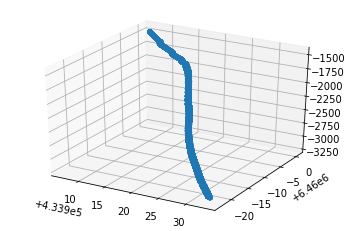

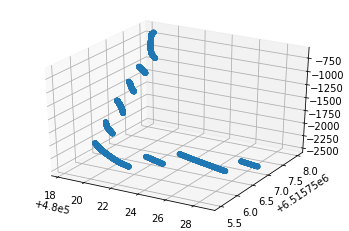

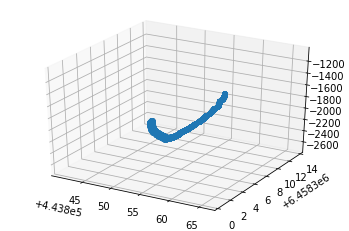

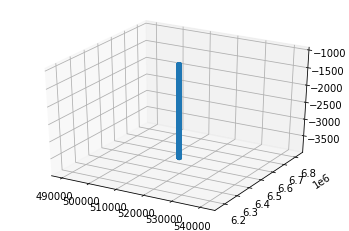

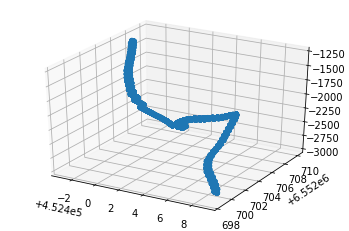

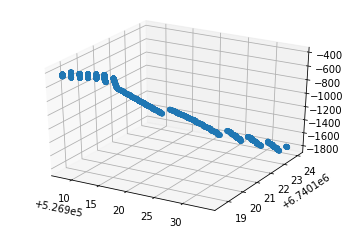

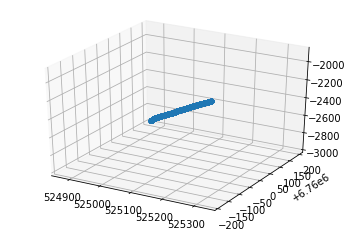

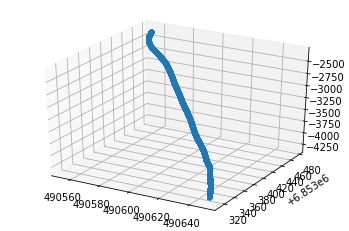

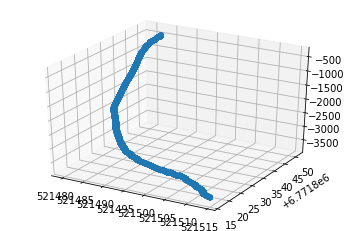

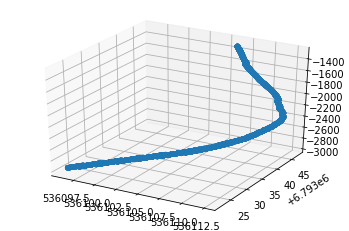

In [ ]:
li = np.arange(0, len(dados_pocos))
for i in li:
  ax = plt.axes(projection = '3d')

  x = dados_pocos[i][i]['X_LOC']
  y = dados_pocos[i][i]['Y_LOC']
  z = dados_pocos[i][i]['Z_LOC']

  ax.scatter3D(x, y, z)
  plt.show()

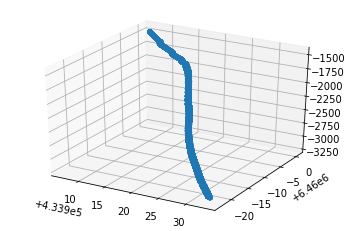

In [ ]:
ax = plt.axes(projection = '3d')

x = dados_pocos[0][0]['X_LOC']
y = dados_pocos[0][0]['Y_LOC']
z = dados_pocos[0][0]['Z_LOC']

ax.scatter3D(x, y, z)

In [ ]:
fig = px.scatter_3d(dados_agregados, x='X_LOC', y='Y_LOC', z='Z_LOC',
              color='FORCE_2020_LITHOFACIES_LITHOLOGY',
              hover_name = 'WELL',
              #template = 'simple_white',
              size_max = 1)
fig.show()

In [ ]:
data.WELL.unique()[1]

'16/2-7'

In [ ]:
li = np.arange(0, len(dados_pocos))
for i in li:
  titulo = str(data.WELL.unique()[i])
  fig = px.scatter_3d(dados_pocos[i][i], x='X_LOC', y='Y_LOC', z='Z_LOC',
              color='FORCE_2020_LITHOFACIES_LITHOLOGY',
              hover_name = "WELL",
              title = 'Poço '+ titulo)
  fig.show()


In [ ]:
fig = px.scatter_3d(dados_pocos[0][0], x='X_LOC', y='Y_LOC', z='Z_LOC',
              color='FORCE_2020_LITHOFACIES_LITHOLOGY',
              hover_name = "WELL")
fig.show()

# Projeção no mapa

https://pyproj4.github.io/pyproj/stable/api/proj.html

In [ ]:
tam = len(dados_agregados) #Definindo o tamanho de linhas
li = np.arange(0,tam) #Definindo um range com o tamanho de linhas
lista = [] # Definindo um array livre
for i in li:
  l = Point(dados_agregados['X_LOC'][i], dados_agregados['Y_LOC'][i])
  lista.append(l)
dados_geometricos = pd.DataFrame()
dados_geometricos['geometry_UTM'] = pd.DataFrame(lista)

/usr/local/lib/python3.7/dist-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning:

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.



In [ ]:
myproj = Proj('+proj=utm +zone=31 +north +ellps=WGS84', preserve_units = False)

In [ ]:
li = np.arange(0, len(dados.WELL.unique()))
cabeca_poco = []
for i in li:
  if i == li.max():
    x = dados_agregados['X_LOC'][contagem[1][i]-1]
    y = dados_agregados['Y_LOC'][contagem[1][i]-1]
  else:
    x = dados_agregados['X_LOC'][contagem[1][i]]
    y = dados_agregados['Y_LOC'][contagem[1][i]]
  zipp = (x,y)
  cabeca_poco.append(zipp)

In [ ]:
lon = []
lat = []
for i in li:
  x, y = myproj(cabeca_poco[i][0], cabeca_poco[i][1], inverse = True)
  lon.append(x)
  lat.append(y)



In [ ]:
cabeca_poco = pd.DataFrame()
cabeca_poco[['lon' ,'lat', 'well']] = pd.DataFrame(zip(lon, lat, dados_agregados['WELL'].unique()))

In [ ]:
fig = px.scatter_geo(dados_geometricos,
                    lat=cabeca_poco.lat,
                    lon=cabeca_poco.lon,
                    title = 'Projeção dos poços no mapa',
                    hover_name = cabeca_poco['well'],
                    projection = 'orthographic',
                    color = cabeca_poco['well'],
                    facet_row_spacing = 1,
                    labels = cabeca_poco['well'])
fig.show()

# Verificação das litologias preditas

In [ ]:
data.FORCE_2020_LITHOFACIES_LITHOLOGY.unique()

array([65000, 65030, 70000, 30000, 99000, 70032, 80000, 90000, 86000,
       74000, 88000])

(3237.624, 1493.28)

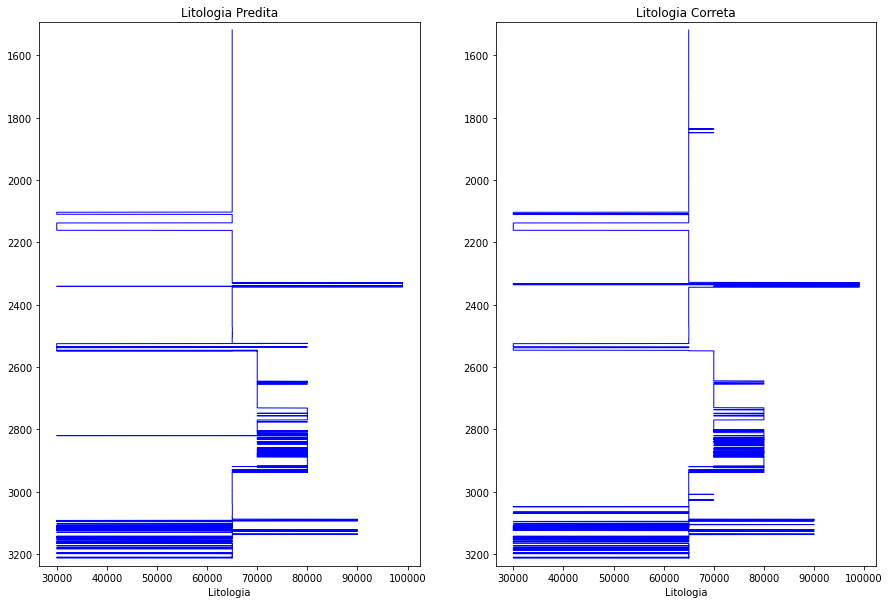

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))

ax1 = plt.subplot2grid((1,2), (0,0), rowspan=1, colspan = 1)
ax2 = plt.subplot2grid((1,2), (0,1), rowspan=1, colspan = 1)

ax1.plot(predicoes_pocos_agregados[0], atributos_pocos_agregados[0]['DEPTH_MD'], color = "blue", linewidth = 1)
ax1.set_xlabel("Litologia")
ax1.set_title("Litologia Predita")
ax1.set_ylim(atributos_pocos_agregados[0]['DEPTH_MD'].max()+25, atributos_pocos_agregados[0]['DEPTH_MD'].min()-25)

ax2.plot(rotulos_pocos_agregados[0], atributos_pocos_agregados[0]['DEPTH_MD'], color = "blue", linewidth = 1)
ax2.set_xlabel("Litologia")
ax2.set_title("Litologia Correta")
ax2.set_ylim(atributos_pocos_agregados[0]['DEPTH_MD'].max()+25, atributos_pocos_agregados[0]['DEPTH_MD'].min()-25)

In [ ]:
lithology_numbers = {30000: {'lith':'Sandstone', 'lith_num':1, 'hatch': '..', 'color':'yellow'},
                 65030: {'lith':'Sandstone/Shale', 'lith_num':2, 'hatch':'-.', 'color':'pink'},
                 65000: {'lith':'Shale', 'lith_num':3, 'hatch':'--', 'color':'gray'},
                 80000: {'lith':'Marl', 'lith_num':4, 'hatch':'', 'color':'#7cfc00'},
                 74000: {'lith':'Dolomite', 'lith_num':5, 'hatch':'-/', 'color':'#8080ff'},
                 70000: {'lith':'Limestone', 'lith_num':6, 'hatch':'+', 'color':'blue'},
                 70032: {'lith':'Chalk', 'lith_num':7, 'hatch':'..', 'color':'#80ffff'},
                 88000: {'lith':'Halite', 'lith_num':8, 'hatch':'x', 'color':'white'},
                 86000: {'lith':'Anhydrite', 'lith_num':9, 'hatch':'', 'color':'red'},
                 99000: {'lith':'Tuff', 'lith_num':10, 'hatch':'||', 'color':'#ff8c00'},
                 90000: {'lith':'Coal', 'lith_num':11, 'hatch':'', 'color':'black'},
                 93000: {'lith':'Basement', 'lith_num':12, 'hatch':'-|', 'color':'green'}}

df_lith = pd.DataFrame.from_dict(lithology_numbers, orient='index')
df_lith.index.name = 'LITHOLOGY'

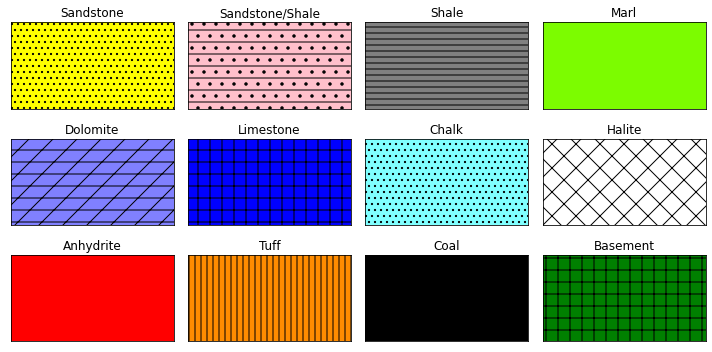

In [ ]:
y = [0, 1]
x = [1, 1]

fig, axes = plt.subplots(ncols=4,nrows=3, sharex=True, sharey=True,
                         figsize=(10,5), subplot_kw={'xticks': [], 'yticks': []})

for ax, key in zip(axes.flat, lithology_numbers.keys()):
    ax.plot(x, y)
    ax.fill_betweenx(y, 0, 1, facecolor=lithology_numbers[key]['color'], hatch=lithology_numbers[key]['hatch'])
    ax.set_xlim(0, 0.1)
    ax.set_ylim(0, 1)
    ax.set_title(str(lithology_numbers[key]['lith']))

plt.tight_layout()

plt.show()

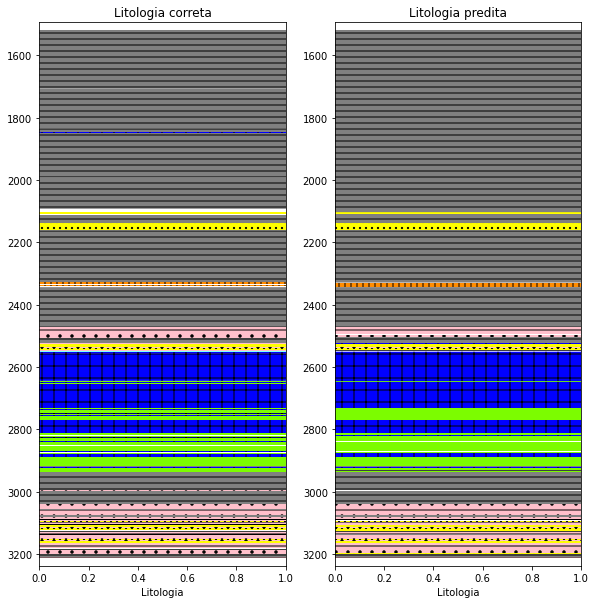

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))


ax1 = plt.subplot2grid((1,3), (0,0), rowspan=1, colspan = 1)
ax1.plot(rotulos_pocos_agregados[0], atributos_pocos_agregados[0]['DEPTH_MD'], color = "black", linewidth = 0.1)
ax1.set_xlabel("Litologia")
ax1.set_title("Litologia correta")
ax1.set_xlim(0, 1)
ax1.set_ylim(atributos_pocos_agregados[0]['DEPTH_MD'].max()+25, atributos_pocos_agregados[0]['DEPTH_MD'].min()-25)
ax1.xaxis.label.set_color("black")
ax1.tick_params(axis='x', colors="black")
ax1.spines["top"].set_edgecolor("black")

ax2 = plt.subplot2grid((1,3), (0,1), rowspan=1, colspan = 1)
ax2.plot(predicoes_pocos_agregados[0], atributos_pocos_agregados[0]['DEPTH_MD'], color = "black", linewidth = 0.1)
ax2.set_xlabel("Litologia")
ax2.set_title("Litologia predita")
ax2.set_xlim(0, 1)
ax2.set_ylim(atributos_pocos_agregados[0]['DEPTH_MD'].max()+25, atributos_pocos_agregados[0]['DEPTH_MD'].min()-25)
ax2.xaxis.label.set_color("black")
ax2.tick_params(axis='x', colors="black")
ax2.spines["top"].set_edgecolor("black")

for key in lithology_numbers.keys():
  color = lithology_numbers[key]['color']
  hatch = lithology_numbers[key]['hatch']
  ax1.fill_betweenx(atributos_pocos_agregados[0]['DEPTH_MD'], 0, rotulos_pocos_agregados[0], where=(rotulos_pocos_agregados[0]==key),
                    facecolor=color, hatch=hatch)
  ax2.fill_betweenx(atributos_pocos_agregados[0]['DEPTH_MD'], 0, predicoes_pocos_agregados[0], where=(predicoes_pocos_agregados[0]==key),
                    facecolor=color, hatch=hatch)

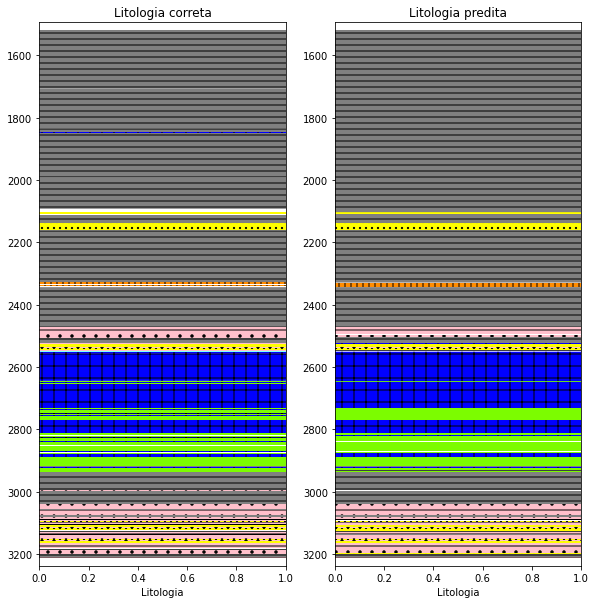

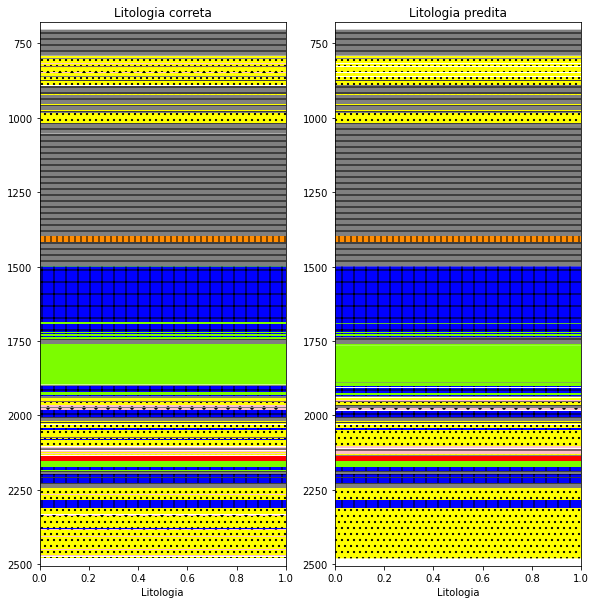

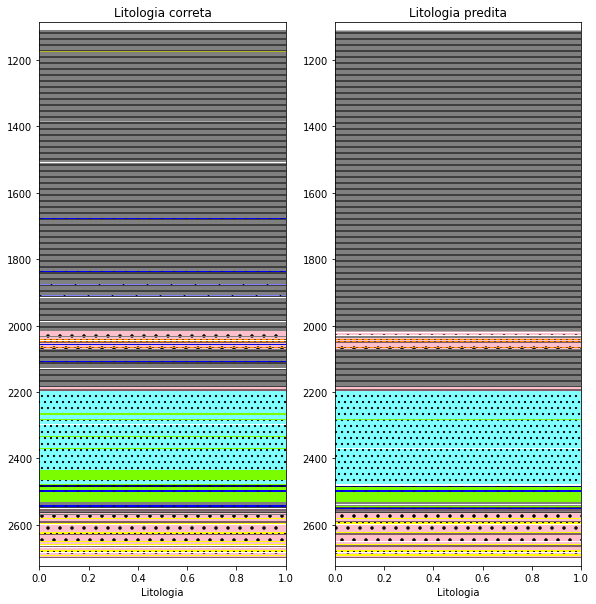

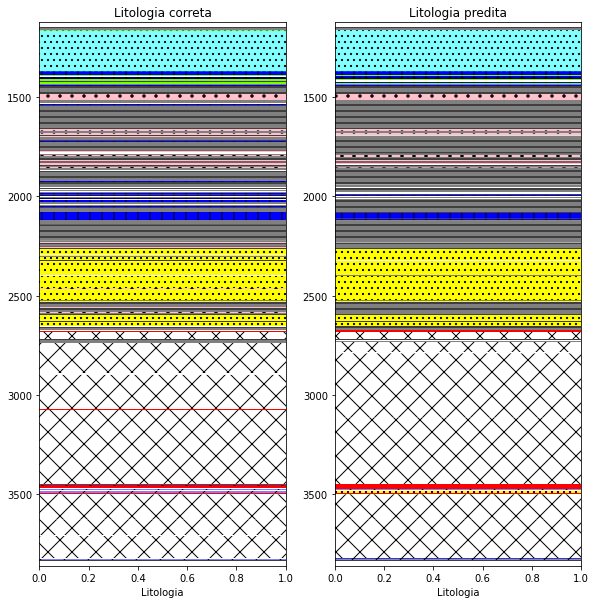

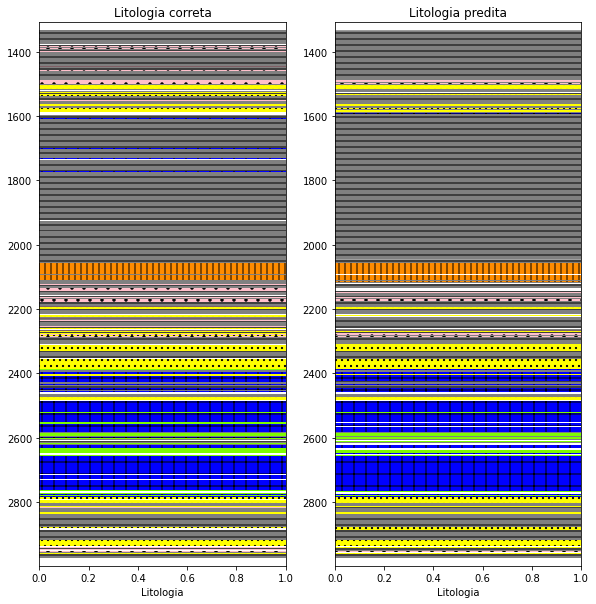

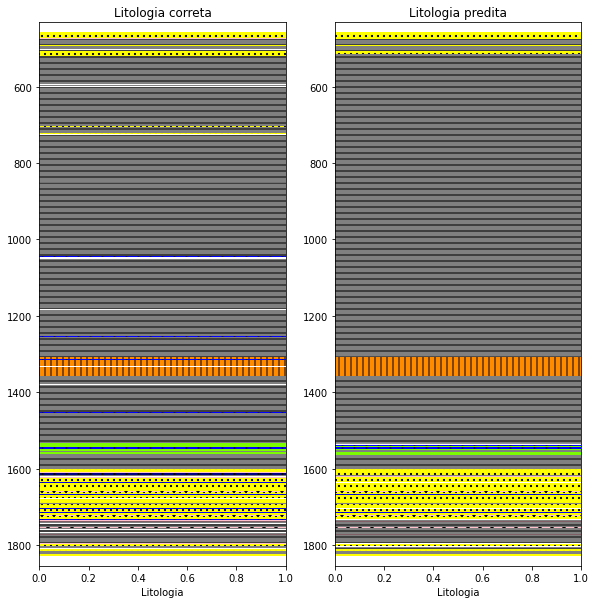

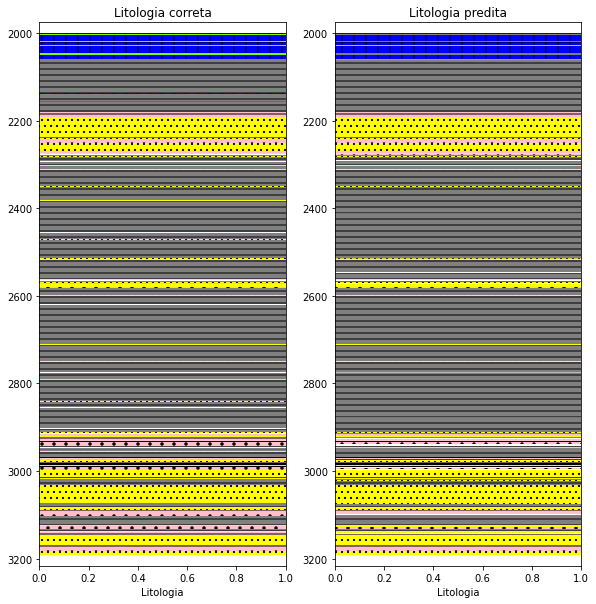

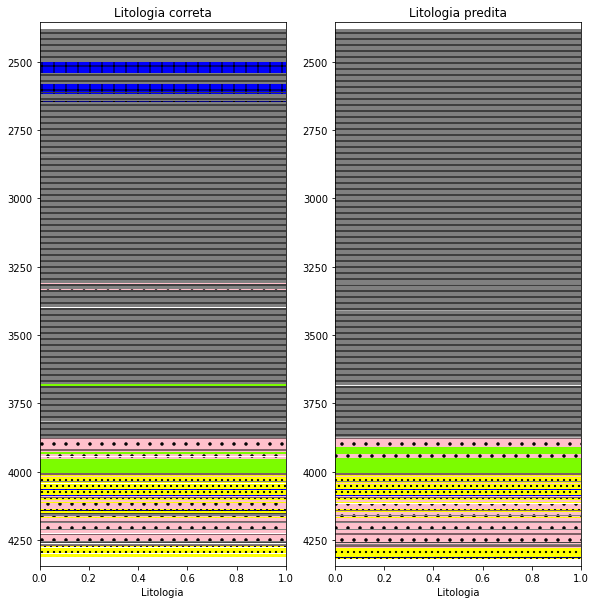

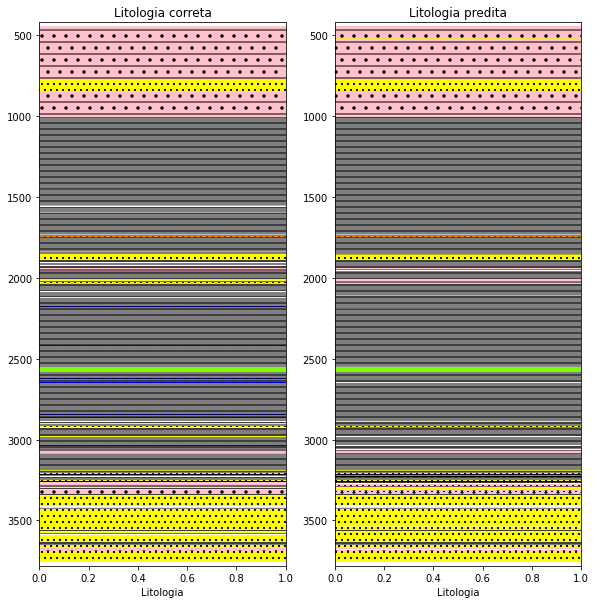

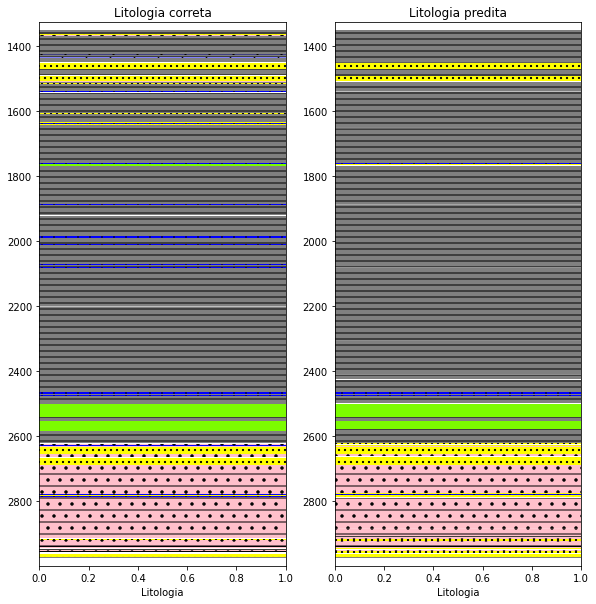

In [ ]:
for i in li:
  fig, ax = plt.subplots(figsize=(15,10))


  ax1 = plt.subplot2grid((1,3), (0,0), rowspan=1, colspan = 1)
  ax1.plot(rotulos_pocos_agregados[i], atributos_pocos_agregados[i]['DEPTH_MD'], color = "black", linewidth = 0.1)
  ax1.set_xlabel("Litologia")
  ax1.set_title("Litologia correta")
  ax1.set_xlim(0, 1)
  ax1.set_ylim(atributos_pocos_agregados[i]['DEPTH_MD'].max()+25, atributos_pocos_agregados[i]['DEPTH_MD'].min()-25)
  ax1.xaxis.label.set_color("black")
  ax1.tick_params(axis='x', colors="black")
  ax1.spines["top"].set_edgecolor("black")

  ax2 = plt.subplot2grid((1,3), (0,1), rowspan=1, colspan = 1)
  ax2.plot(predicoes_pocos_agregados[i], atributos_pocos_agregados[i]['DEPTH_MD'], color = "black", linewidth = 0.1)
  ax2.set_xlabel("Litologia")
  ax2.set_title("Litologia predita")
  ax2.set_xlim(0, 1)
  ax2.set_ylim(atributos_pocos_agregados[i]['DEPTH_MD'].max()+25, atributos_pocos_agregados[i]['DEPTH_MD'].min()-25)
  ax2.xaxis.label.set_color("black")
  ax2.tick_params(axis='x', colors="black")
  ax2.spines["top"].set_edgecolor("black")

  for key in lithology_numbers.keys():
    color = lithology_numbers[key]['color']
    hatch = lithology_numbers[key]['hatch']
    ax1.fill_betweenx(atributos_pocos_agregados[i]['DEPTH_MD'], 0, rotulos_pocos_agregados[i], where=(rotulos_pocos_agregados[i]==key),
                    facecolor=color, hatch=hatch)
    ax2.fill_betweenx(atributos_pocos_agregados[i]['DEPTH_MD'], 0, predicoes_pocos_agregados[i], where=(predicoes_pocos_agregados[i]==key),
                    facecolor=color, hatch=hatch)
  fig.show()